## Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Check top 45 countries

In [2]:
df = pd.read_csv("../output/data_cleaning/1_data_exploration.csv")
df

,country,year,iso_code,population,gdp,primary_energy_consumption,cement_co2,coal_co2,consumption_co2,flaring_co2,gas_co2,land_use_change_co2,oil_co2,other_industry_co2,trade_co2,cumulative_co2_including_luc,co2_including_luc
0,Argentina,1850,ARG,1088372.0,2.193400e+09,NaN,NaN,NaN,NaN,NaN,NaN,11.576,NaN,NaN,NaN,NaN,NaN
1,Argentina,1851,ARG,1115018.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.035,NaN,NaN,NaN,NaN,NaN
2,Argentina,1852,ARG,1138141.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.062,NaN,NaN,NaN,NaN,NaN
3,Argentina,1853,ARG,1157536.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.150,NaN,NaN,NaN,NaN,NaN
4,Argentina,1854,ARG,1177263.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.177,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8422,Vietnam,2018,VNM,94914328.0,6.815014e+11,1083.274,49.637,122.121,163.236,1.373,18.554,247.029,66.036,NaN,-94.486,12087.070,504.751
8423,Vietnam,2019,VNM,95776712.0,7.316531e+11,1202.636,56.538,191.443,211.240,1.453,18.906,248.054,73.449,NaN,-130.548,12676.914,589.843
8424,Vietnam,2020,VNM,96648680.0,7.526296e+11,1204.393,60.066,215.817,224.800,1.257,16.931,249.736,69.272,NaN,-138.543,13289.992,613.079
8425,Vietnam,2021,VNM,97468024.0,7.719120e+11,1208.554,62.071,211.893,227.044,0.995,13.757,252.922,63.838,NaN,-125.509,13895.467,605.475


1. Check numerical values. Look for missing values.

In [24]:
#function to check missing values
def missing_values(df):
    return df.isna().sum()/df.shape[0]*100

# Function to calculate the percentage of missing values for each country
def calculate_missing_values_percentage(df, column):
    missing_percentage = df.groupby('country').apply(lambda x: x[column].isna().mean() * 100, include_groups=False)
    missing_percentage_df = missing_percentage.reset_index(name='missing_percentage')
    missing_percentage_df = missing_percentage_df.sort_values(by='missing_percentage', ascending=False).reset_index(drop=True)

    return missing_percentage_df

In [4]:
missing_values(df)

country                          0.000000
year                             0.000000
iso_code                         0.000000
population                       1.863059
gdp                             36.133855
primary_energy_consumption      70.986116
cement_co2                      42.470630
coal_co2                        19.686721
consumption_co2                 83.683399
flaring_co2                     19.034057
gas_co2                         19.034057
land_use_change_co2              7.618370
oil_co2                         19.034057
other_industry_co2              89.616708
trade_co2                       83.683399
cumulative_co2_including_luc    24.279103
co2_including_luc               24.279103
dtype: float64

2. Charts co2 by year by top 45 countries

In [5]:
#function to check missing values on line chart based on choosing column
def line_chart_missing_values(df, column, column_name):
    countries = df.groupby('country')[column].max().sort_values(ascending=False).index
    num_countries = len(countries)
    num_cols = 5  # Number of columns for the subplot grid
    num_rows = (num_countries - 1) // num_cols + 1  # Calculate the number of rows needed

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 25), squeeze=False)

    for i, country in enumerate(countries):
        country_df = df[df['country'] == country]
        row = i // num_cols
        col = i % num_cols
        ax = axs[row, col]

        first_year_nonnull_co2 = country_df.loc[country_df[column].notnull(), 'year'].min()
        missing_years = country_df[country_df[column].isnull()]['year'] 

        ax.plot(country_df['year'], country_df[column])
        ax.set_title(f'CO2 Emissions Over Time in {country}')
        ax.set_xlabel('Year')
        ax.set_ylabel(column_name)
        ax.grid(True)

        # Plotting missing years as vertical lines
        for year in missing_years:
            ax.axvline(x=year, color='r', linestyle='--', alpha=0.5)  # Vertical lines for missing years
        
        # Adding text annotation for missing years
        if not missing_years.empty:
            missing_text = f"Missing years: {', '.join(map(str, missing_years))}"
            ax.text(0.5, -0.3, missing_text, ha='center', va='top', fontsize=8, color='red', transform=ax.transAxes)

        # Adding a marker for the first year with non-zero column
        if not pd.isna(first_year_nonnull_co2):
            ax.scatter([first_year_nonnull_co2], [country_df.loc[country_df['year'] == first_year_nonnull_co2, column].iloc[0]], color='red', zorder=5)
            ax.annotate(first_year_nonnull_co2, xy=(first_year_nonnull_co2, country_df.loc[country_df['year'] == first_year_nonnull_co2, column].iloc[0]), xytext=(0, -12), 
                        textcoords='offset points', ha='center', fontsize=8, color='red')

    plt.tight_layout()
    plt.show()

In [6]:
# Filter out all years before the first non-null year
def process_country_data_before(country_df, column):
    first_nonnull_year = country_df.loc[country_df[column].notnull(), 'year'].min()
    
    return country_df[country_df['year'] >= first_nonnull_year]

# Remove any rows with missing values
def process_country_data_after(country_df, column):
    first_nonnull_year = country_df.loc[country_df[column].notnull(), 'year'].min()
    filtered_df = country_df[country_df['year'] >= first_nonnull_year]

    return filtered_df.dropna(subset=[column])

# Function to fill missing values
def process_country_data_fill(country_df, column):
    country_filled_df = country_df.copy()
    country_filled_df.loc[:, column] = country_filled_df[column].interpolate(method='linear')
    
    return country_filled_df

# Apply the function to each country
def apply_process_country_data(df, column, process_function):
    processed_dfs = []

    for country in df['country'].unique():
        country_df = df[df['country'] == country]
        processed_df = process_function(country_df, column)
        processed_dfs.append(processed_df)

    processed_df = pd.concat(processed_dfs).reset_index(drop=True)

    return processed_df

2a. Check 'co2_including_luc' column

In [7]:
column_co2 = 'co2_including_luc'
column_name_co2 = 'CO2 Emissions'

/var/folders/rr/wwj3830d6bng6q6lhqs55ydr0000gn/T/ipykernel_44310/616249939.py:40: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


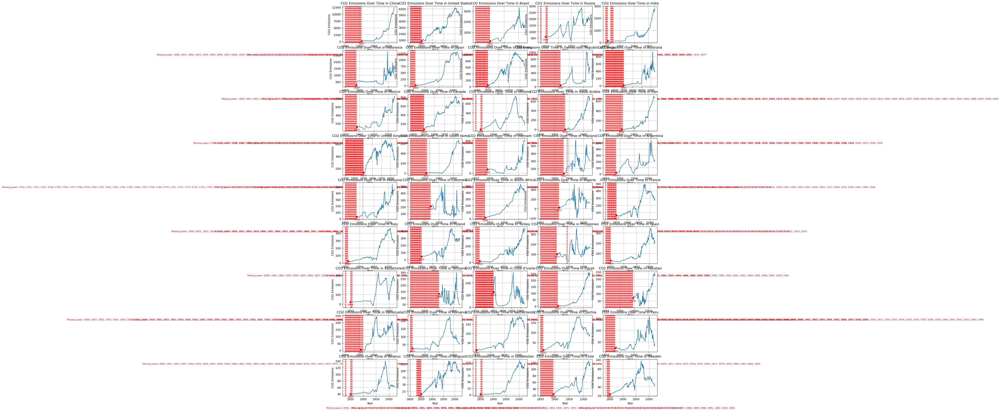

In [8]:
line_chart_missing_values(df, column_co2, column_name_co2)

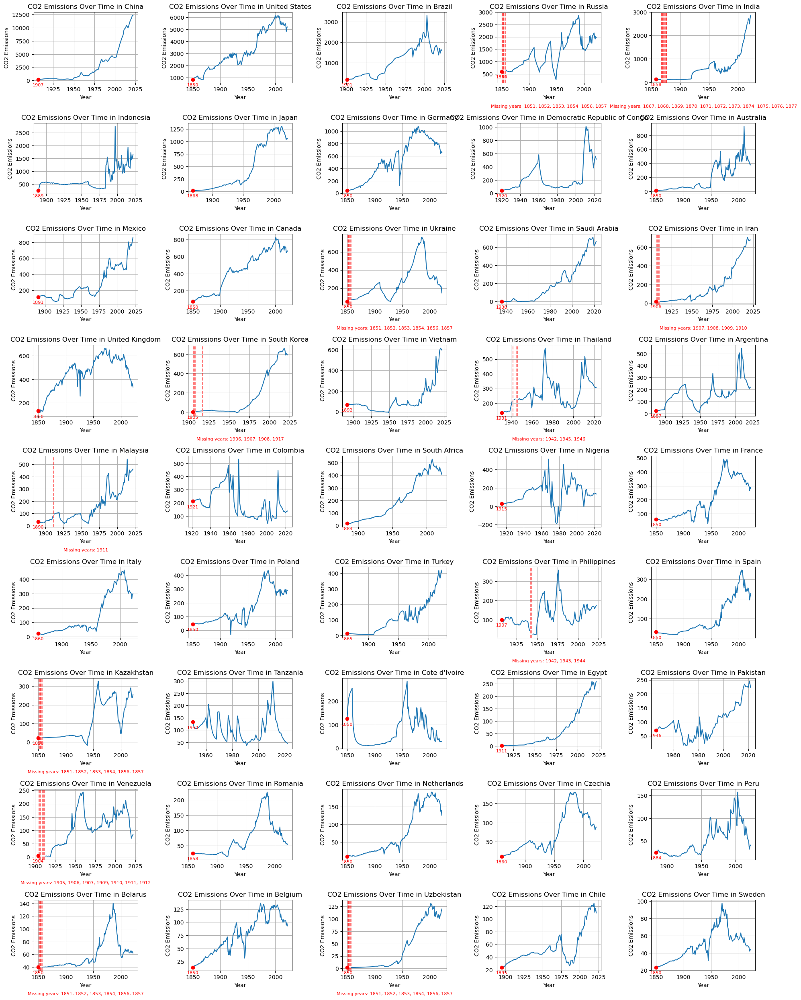

In [9]:
# Process data by removing missing values before the first non-null value
processed1_df_before = apply_process_country_data(df, column_co2, process_country_data_before)
line_chart_missing_values(processed1_df_before, column_co2, column_name_co2)

In [10]:
missing_values(processed1_df_before)

country                          0.000000
year                             0.000000
iso_code                         0.000000
population                       0.000000
gdp                             22.873991
primary_energy_consumption      62.057728
cement_co2                      27.157045
coal_co2                         2.529485
consumption_co2                 78.662322
flaring_co2                      2.529485
gas_co2                          2.529485
land_use_change_co2              0.000000
oil_co2                          2.529485
other_industry_co2              86.421477
trade_co2                       78.662322
cumulative_co2_including_luc     0.977654
co2_including_luc                0.977654
dtype: float64

In [25]:
# Check missing values for each country
calculate_missing_values_percentage(processed1_df_before, column_co2)

,country,missing_percentage
0,India,6.666667
1,Venezuela,5.882353
2,Belarus,3.468208
3,Uzbekistan,3.468208
4,Ukraine,3.468208
5,Kazakhstan,3.468208
6,Russia,3.468208
7,Iran,3.418803
8,South Korea,3.389831
9,Thailand,3.260870


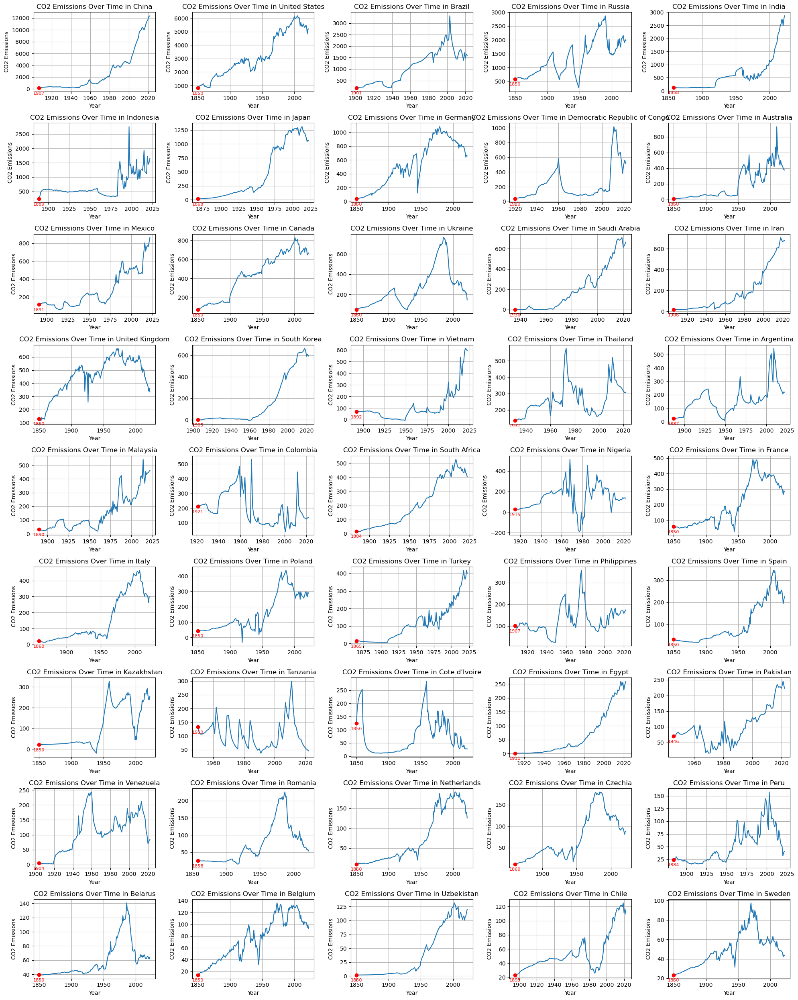

In [26]:
# Process data by filling missing values - max 7% are missing
processed1_df_fill = apply_process_country_data(processed1_df_before, column_co2, process_country_data_fill)
line_chart_missing_values(processed1_df_fill, column_co2, column_name_co2)

In [27]:
missing_values(processed1_df_fill)

country                          0.000000
year                             0.000000
iso_code                         0.000000
population                       0.000000
gdp                             22.873991
primary_energy_consumption      62.057728
cement_co2                      27.157045
coal_co2                         2.529485
consumption_co2                 78.662322
flaring_co2                      2.529485
gas_co2                          2.529485
land_use_change_co2              0.000000
oil_co2                          2.529485
other_industry_co2              86.421477
trade_co2                       78.662322
cumulative_co2_including_luc     0.977654
co2_including_luc                0.000000
dtype: float64

2b. Remove columns with missing values ​​greater than 50% + 'iso_code' column which is not significant

In [28]:
processed2_df = processed1_df_fill.drop(columns={'iso_code', 'primary_energy_consumption', 'consumption_co2', 'other_industry_co2', 'trade_co2'})
processed2_df

,country,year,population,gdp,cement_co2,coal_co2,flaring_co2,gas_co2,land_use_change_co2,oil_co2,cumulative_co2_including_luc,co2_including_luc
0,Argentina,1887,3061098.0,NaN,NaN,1.085,0.000,0.000,21.115,0.000,22.199,22.199
1,Argentina,1888,3158873.0,NaN,NaN,0.890,0.000,0.000,21.114,0.000,44.204,22.005
2,Argentina,1889,3260729.0,NaN,NaN,1.755,0.000,0.000,21.345,0.000,67.304,23.100
3,Argentina,1890,3366831.0,1.300098e+10,NaN,1.370,0.000,0.000,23.145,0.000,91.819,24.516
4,Argentina,1891,3477345.0,NaN,NaN,0.938,0.000,0.000,24.614,0.000,117.371,25.552
...,...,...,...,...,...,...,...,...,...,...,...,...
6439,Vietnam,2018,94914328.0,6.815014e+11,49.637,122.121,1.373,18.554,247.029,66.036,12087.070,504.751
6440,Vietnam,2019,95776712.0,7.316531e+11,56.538,191.443,1.453,18.906,248.054,73.449,12676.914,589.843
6441,Vietnam,2020,96648680.0,7.526296e+11,60.066,215.817,1.257,16.931,249.736,69.272,13289.992,613.079
6442,Vietnam,2021,97468024.0,7.719120e+11,62.071,211.893,0.995,13.757,252.922,63.838,13895.467,605.475


In [29]:
missing_values(processed2_df)

country                          0.000000
year                             0.000000
population                       0.000000
gdp                             22.873991
cement_co2                      27.157045
coal_co2                         2.529485
flaring_co2                      2.529485
gas_co2                          2.529485
land_use_change_co2              0.000000
oil_co2                          2.529485
cumulative_co2_including_luc     0.977654
co2_including_luc                0.000000
dtype: float64

2c. Check 'coal_co2' column

In [30]:
column_coal = 'coal_co2'
column_name_coal = 'CO2 Coal'

/var/folders/rr/wwj3830d6bng6q6lhqs55ydr0000gn/T/ipykernel_44310/616249939.py:40: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


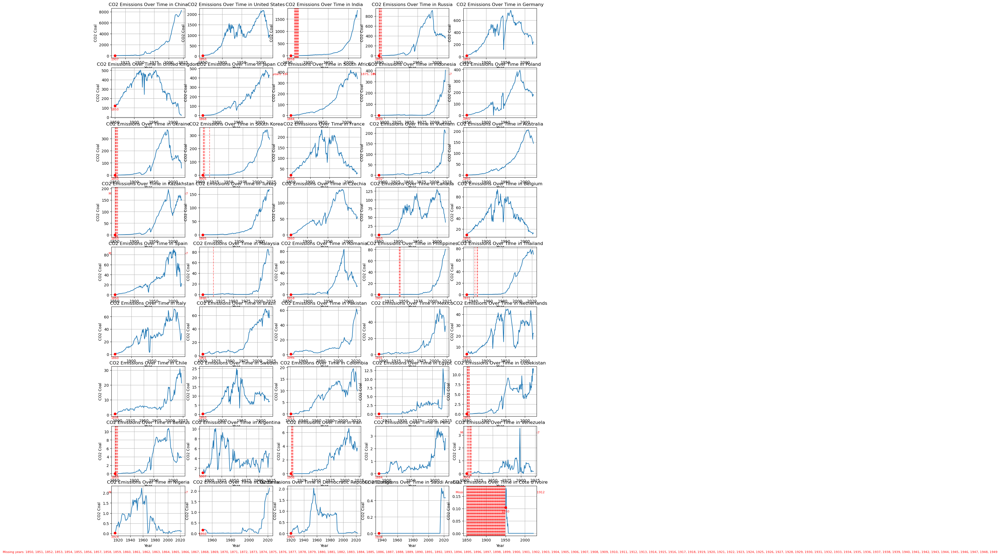

In [31]:
line_chart_missing_values(processed2_df, column_coal, column_name_coal)

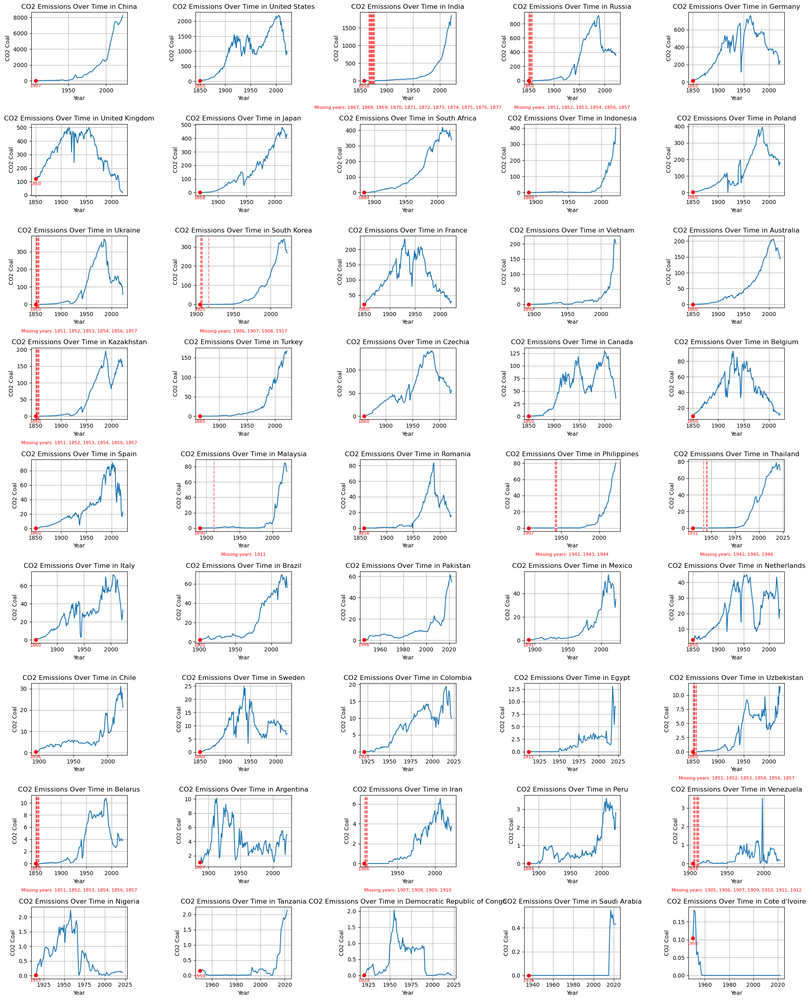

In [32]:
# Process data by removing missing values before the first non-null value
processed3_df_before = apply_process_country_data(processed2_df, column_coal, process_country_data_before)
line_chart_missing_values(processed3_df_before, column_coal, column_name_coal)

In [33]:
missing_values(processed3_df_before)

country                          0.000000
year                             0.000000
population                       0.000000
gdp                             21.658260
cement_co2                      27.585120
coal_co2                         0.993064
flaring_co2                      0.993064
gas_co2                          0.993064
land_use_change_co2              0.000000
oil_co2                          0.993064
cumulative_co2_including_luc     0.993064
co2_including_luc                0.000000
dtype: float64

In [34]:
# Check missing values for each country
calculate_missing_values_percentage(processed3_df_before, column_coal)

,country,missing_percentage
0,India,6.666667
1,Venezuela,5.882353
2,Belarus,3.468208
3,Uzbekistan,3.468208
4,Ukraine,3.468208
5,Kazakhstan,3.468208
6,Russia,3.468208
7,Iran,3.418803
8,South Korea,3.389831
9,Thailand,3.260870


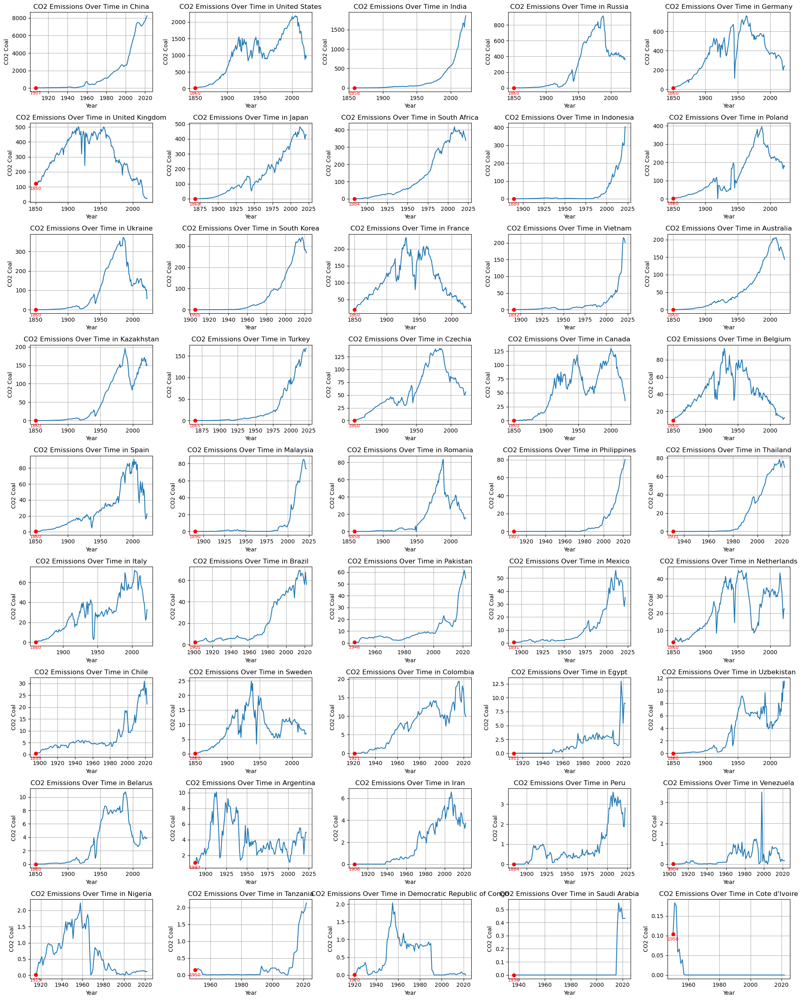

In [35]:
# Process data by filling missing values - max 7% are missing (because this is the same % for coal_co2, flaring_co2, gas_co2, oil_co2 and cumulative_co2_including_luc I use fill to all of that columns)
processed3a_df_fill = apply_process_country_data(processed3_df_before, column_coal, process_country_data_fill)
processed3b_df_fill = apply_process_country_data(processed3a_df_fill, 'flaring_co2', process_country_data_fill)
processed3c_df_fill = apply_process_country_data(processed3b_df_fill, 'gas_co2', process_country_data_fill)
processed3d_df_fill = apply_process_country_data(processed3c_df_fill, 'oil_co2', process_country_data_fill)
processed3_df_fill = apply_process_country_data(processed3d_df_fill, 'cumulative_co2_including_luc', process_country_data_fill)
line_chart_missing_values(processed3_df_fill, column_coal, column_name_coal)

In [36]:
missing_values(processed3_df_fill)

country                          0.00000
year                             0.00000
population                       0.00000
gdp                             21.65826
cement_co2                      27.58512
coal_co2                         0.00000
flaring_co2                      0.00000
gas_co2                          0.00000
land_use_change_co2              0.00000
oil_co2                          0.00000
cumulative_co2_including_luc     0.00000
co2_including_luc                0.00000
dtype: float64

2d. Check 'gdp' column

In [37]:
column_gdp = 'gdp'
column_name_gdp = 'GDP'

/var/folders/rr/wwj3830d6bng6q6lhqs55ydr0000gn/T/ipykernel_44310/616249939.py:40: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


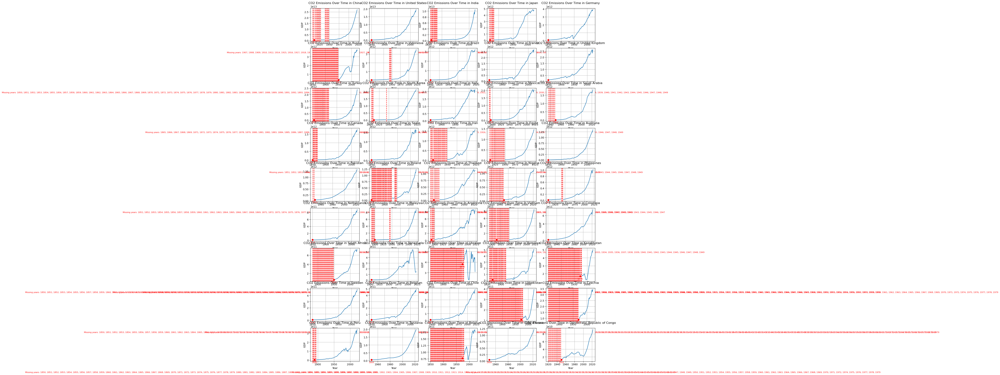

In [38]:
line_chart_missing_values(processed3_df_fill, column_gdp, column_name_gdp)

/var/folders/rr/wwj3830d6bng6q6lhqs55ydr0000gn/T/ipykernel_44310/616249939.py:40: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


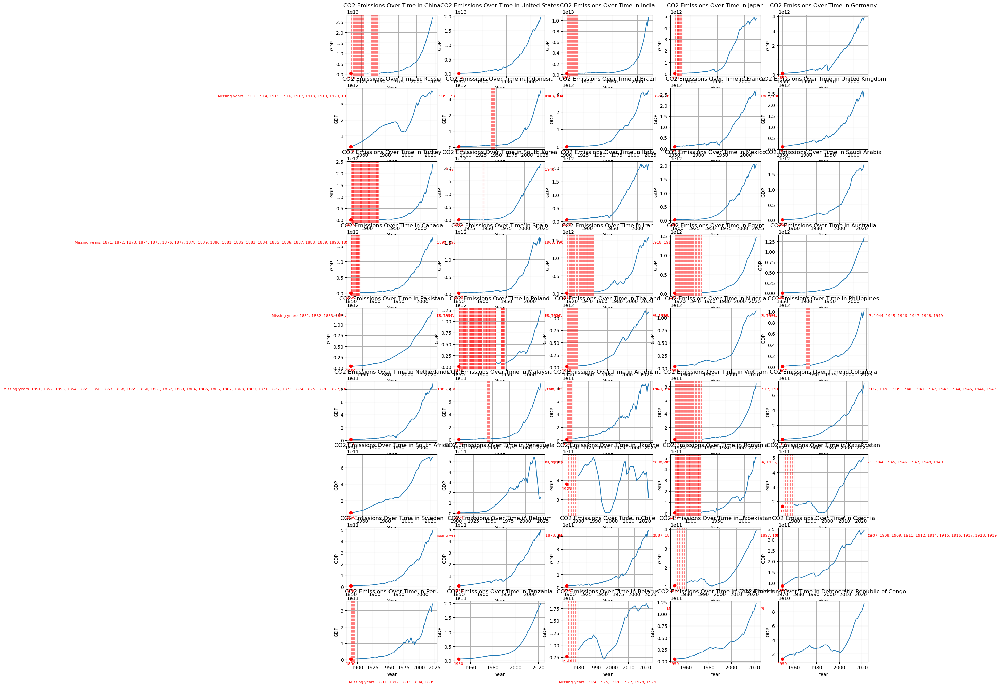

In [39]:
# Process data by removing missing values before the first non-null value
processed4_df_before = apply_process_country_data(processed3_df_before, column_gdp, process_country_data_before)
line_chart_missing_values(processed4_df_before, column_gdp, column_name_gdp)

In [40]:
missing_values(processed4_df_before)

country                          0.000000
year                             0.000000
population                       0.000000
gdp                              7.980004
cement_co2                      23.217923
coal_co2                         0.000000
flaring_co2                      0.000000
gas_co2                          0.000000
land_use_change_co2              0.000000
oil_co2                          0.000000
cumulative_co2_including_luc     0.000000
co2_including_luc                0.000000
dtype: float64

In [43]:
# Check missing values for each country
missing_gdp = calculate_missing_values_percentage(processed4_df_before, column_gdp)
missing_gdp

,country,missing_percentage
0,Poland,46.820809
1,Turkey,33.333333
2,Vietnam,32.727273
3,Egypt,32.727273
4,Iran,32.727273
5,Romania,29.411765
6,China,24.107143
7,India,12.962963
8,Thailand,12.941176
9,Belarus,12.000000


In [44]:
missing_gdp[missing_gdp['missing_percentage'] > 7]['country'].unique()

array(['Poland', 'Turkey', 'Vietnam', 'Egypt', 'Iran', 'Romania', 'China',
       'India', 'Thailand', 'Belarus', 'Uzbekistan', 'Ukraine',
       'Kazakhstan', 'Canada', 'Japan'], dtype=object)

In [46]:
#Process data

#Filter data on 2 datasets, where missing values > 7% and <= 7%
unique_countries_more_than_7 = missing_gdp[missing_gdp['missing_percentage'] > 7]['country'].unique()
unique_countries_less_than_7 = missing_gdp[missing_gdp['missing_percentage'] <= 7]['country'].unique()

processed4_df_more_than_7 = processed4_df_before[processed4_df_before['country'].isin(unique_countries_more_than_7)]
processed4_df_less_than_7 = processed4_df_before[processed4_df_before['country'].isin(unique_countries_less_than_7)]

#Missing values > 7% are removed
processed4_df_after = apply_process_country_data(processed4_df_more_than_7, column_gdp, process_country_data_after)

#Missing values <= 7% are filled
processed4_df_fill = apply_process_country_data(processed4_df_less_than_7, column_gdp, process_country_data_fill)

# Combine the two processed DataFrames into one
processed4_df = pd.concat([processed4_df_after, processed4_df_fill]).reset_index(drop=True)

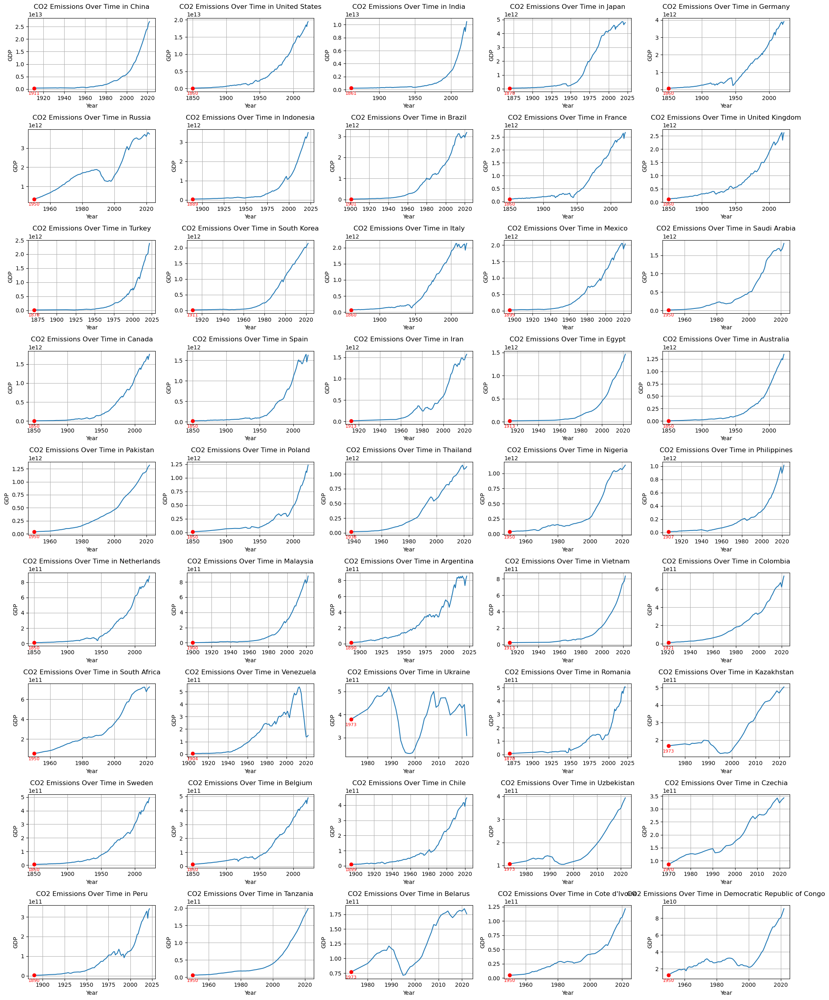

In [47]:
#Line chart
line_chart_missing_values(processed4_df, column_gdp, column_name_gdp)

In [48]:
missing_values(processed4_df_fill)

country                          0.000000
year                             0.000000
population                       0.000000
gdp                              0.000000
cement_co2                      21.769625
coal_co2                         0.000000
flaring_co2                      0.000000
gas_co2                          0.000000
land_use_change_co2              0.000000
oil_co2                          0.000000
cumulative_co2_including_luc     0.000000
co2_including_luc                0.000000
dtype: float64

2e. Check 'cement_co2' column

In [49]:
column_cement = 'cement_co2'
column_name_cement = 'CO2 Cement'

/var/folders/rr/wwj3830d6bng6q6lhqs55ydr0000gn/T/ipykernel_44310/616249939.py:40: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


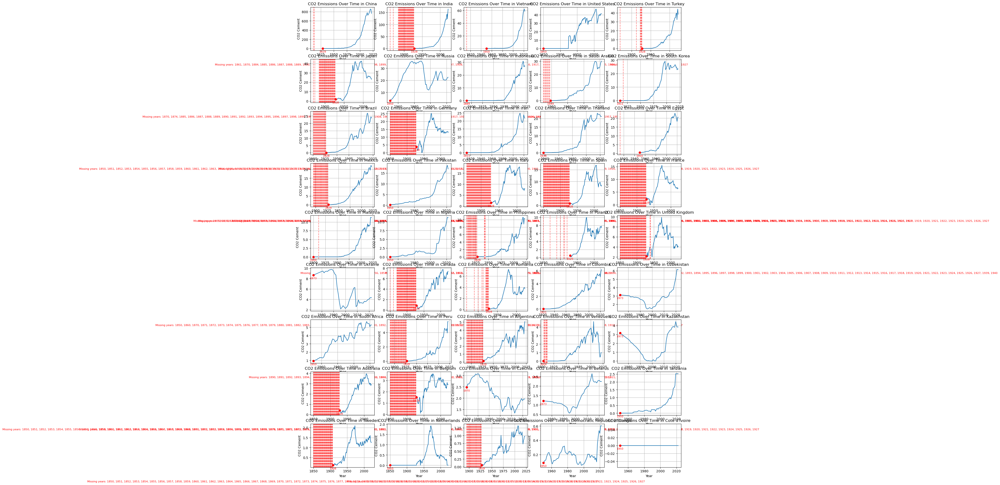

In [50]:
line_chart_missing_values(processed4_df, column_cement, column_name_cement)

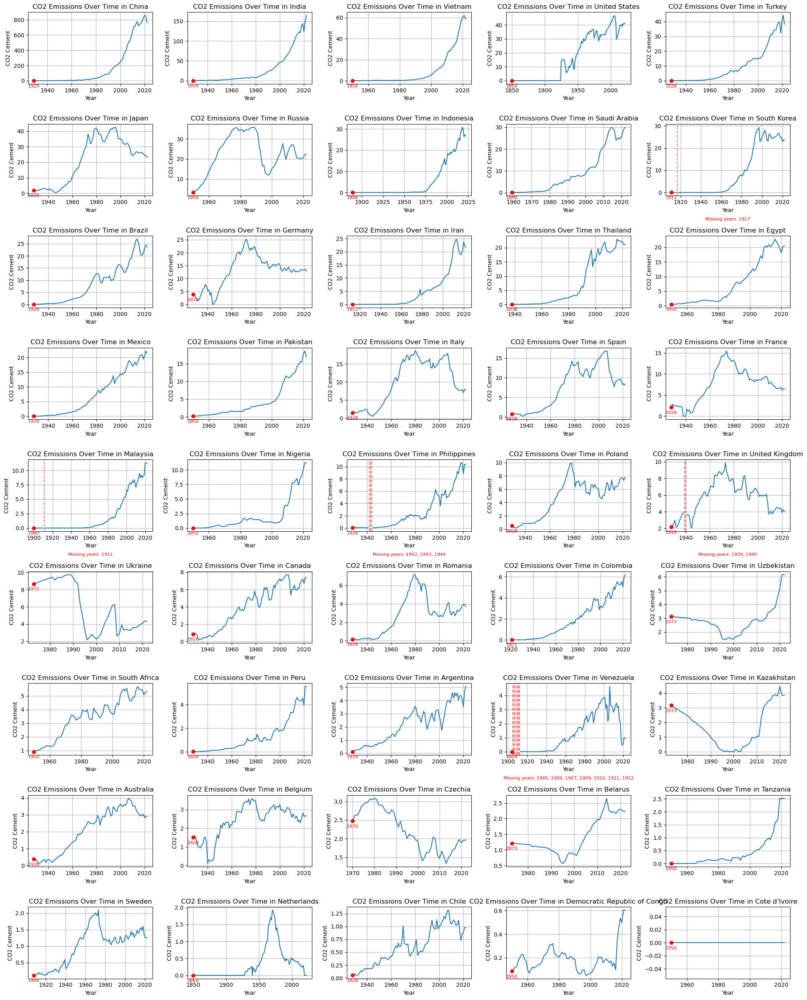

In [51]:
# Process data by removing missing values before the first non-null value
processed5_df_before = apply_process_country_data(processed4_df, column_cement, process_country_data_before)
line_chart_missing_values(processed5_df_before, column_cement, column_name_cement)

In [52]:
missing_values(processed5_df_before)

country                         0.000000
year                            0.000000
population                      0.000000
gdp                             0.000000
cement_co2                      0.347653
coal_co2                        0.000000
flaring_co2                     0.000000
gas_co2                         0.000000
land_use_change_co2             0.000000
oil_co2                         0.000000
cumulative_co2_including_luc    0.000000
co2_including_luc               0.000000
dtype: float64

In [53]:
# Check missing values for each country
missing_cement = calculate_missing_values_percentage(processed5_df_before, column_cement)
missing_cement

,country,missing_percentage
0,Venezuela,5.882353
1,Philippines,3.157895
2,United Kingdom,2.105263
3,South Korea,0.892857
4,Malaysia,0.813008
5,Argentina,0.000000
6,South Africa,0.000000
7,Pakistan,0.000000
8,Peru,0.000000
9,Poland,0.000000


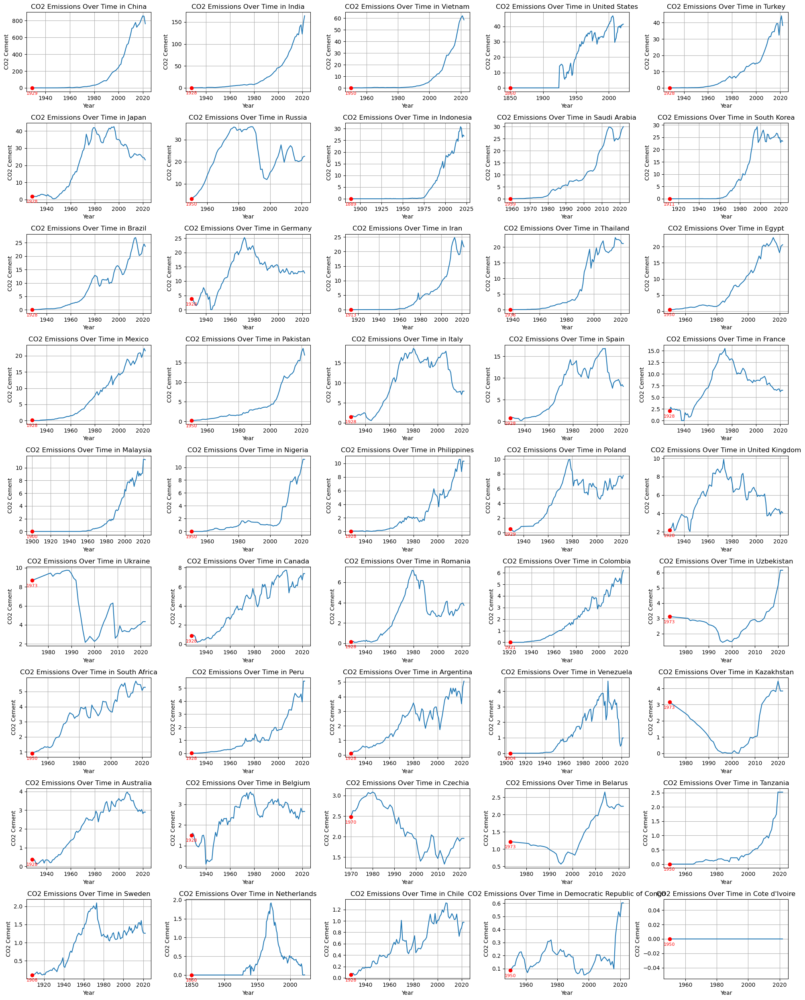

In [54]:
# Process data by filling missing values - max 6% missing
processed5_df_fill = apply_process_country_data(processed5_df_before, column_cement, process_country_data_fill)
line_chart_missing_values(processed5_df_fill, column_cement, column_name_cement)

In [55]:
missing_values(processed5_df_fill)

country                         0.0
year                            0.0
population                      0.0
gdp                             0.0
cement_co2                      0.0
coal_co2                        0.0
flaring_co2                     0.0
gas_co2                         0.0
land_use_change_co2             0.0
oil_co2                         0.0
cumulative_co2_including_luc    0.0
co2_including_luc               0.0
dtype: float64

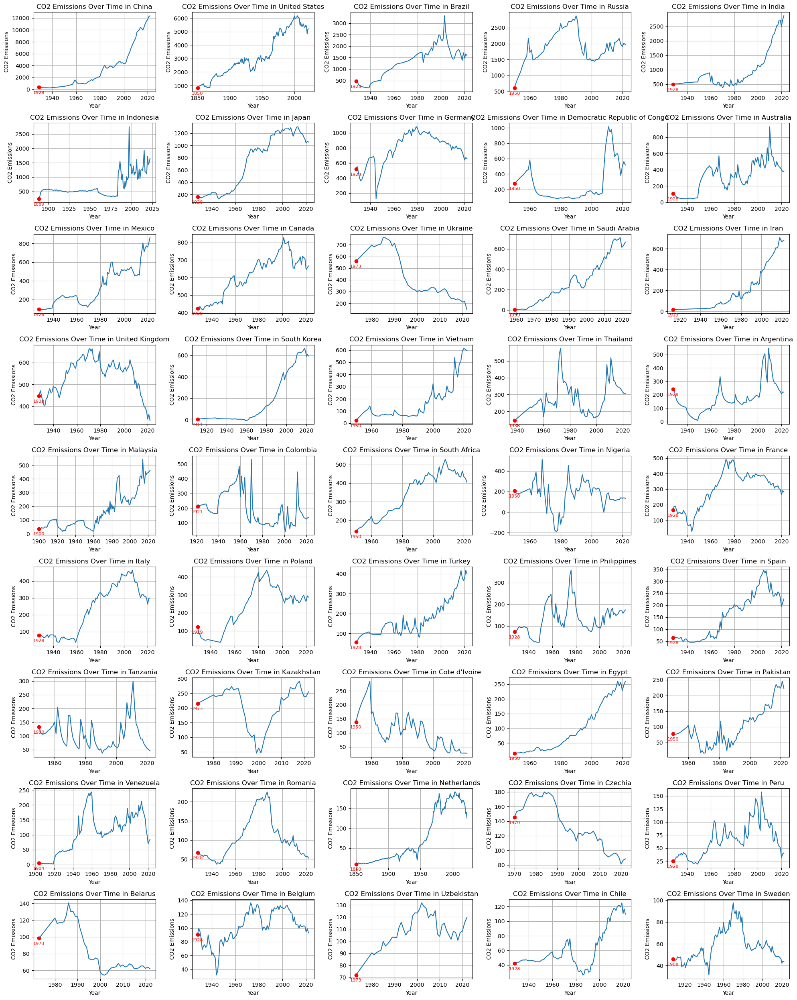

In [56]:
#Final co2 emission line charts
line_chart_missing_values(processed5_df_fill, column_co2, column_name_co2)

In [57]:
#when I removed all missing values - 3998 stayed
#when I filled missing values - 4164 stayed
#when I filled most missing values, ony gdp removed for some countries - 4027 stayed
processed5_df_fill

,country,year,population,gdp,cement_co2,coal_co2,flaring_co2,gas_co2,land_use_change_co2,oil_co2,cumulative_co2_including_luc,co2_including_luc
0,Belarus,1973,9369577.0,7.704135e+10,1.214,7.975,0.509,6.632,21.873,60.289,5850.018,98.493
1,Belarus,1980,9817256.0,9.148984e+10,1.167,8.670,0.418,10.134,25.360,76.813,6612.405,122.562
2,Belarus,1981,9877123.0,9.561242e+10,1.160,7.651,0.405,10.577,20.616,75.579,6728.394,115.989
3,Belarus,1982,9938940.0,9.990980e+10,1.103,7.818,0.406,11.286,19.833,76.531,6845.371,116.977
4,Belarus,1983,10004049.0,1.050185e+11,1.116,7.811,0.402,12.192,18.491,76.980,6962.363,116.992
...,...,...,...,...,...,...,...,...,...,...,...,...
4022,Venezuela,2018,29825652.0,2.725990e+11,0.793,0.125,15.594,41.705,12.665,42.518,12234.599,113.400
4023,Venezuela,2019,28971686.0,1.971709e+11,0.453,0.242,17.938,34.475,9.066,34.504,12331.276,96.677
4024,Venezuela,2020,28490458.0,1.380295e+11,0.580,0.172,16.147,25.713,7.900,19.345,12401.133,69.856
4025,Venezuela,2021,28199862.0,1.386561e+11,0.986,0.172,15.395,33.296,7.564,21.764,12480.310,79.177


In [59]:
processed5_df_fill.to_csv('../output/data_cleaning/2_cleaned_data_45_countries.csv', index=False)